In [12]:
import config
import torch
import torch.optim as optim

from model import YOLOv3
from tqdm.auto import tqdm
from utils import (
    mean_average_precision,
    cells_to_bboxes,
    get_evaluation_bboxes,
    check_class_accuracy,
    get_loaders,
    plot_couple_examples
)
from loss import YoloLoss
import warnings
warnings.filterwarnings("ignore")

torch.backends.cudnn.benchmark = True

In [6]:
def train_fn(train_loader, model, optimizer, loss_fn, scaler, scaled_anchors):
    loop = tqdm(train_loader, leave=True)
    losses = []
    for batch_idx, (x, y) in enumerate(loop):
        x = x.to(config.DEVICE)
        y0, y1, y2 = (
            y[0].to(config.DEVICE),
            y[1].to(config.DEVICE),
            y[2].to(config.DEVICE),
        )

        with torch.cuda.amp.autocast():
            out = model(x)
            loss = (
                loss_fn(out[0], y0, scaled_anchors[0])
                + loss_fn(out[1], y1, scaled_anchors[1])
                + loss_fn(out[2], y2, scaled_anchors[2])
            )

        losses.append(loss.item())
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # update progress bar
        mean_loss = sum(losses) / len(losses)
        loop.set_postfix(loss=mean_loss)


In [7]:
model = YOLOv3(num_classes=config.NUM_CLASSES).to(config.DEVICE)
optimizer = optim.Adam(
    model.parameters(), lr=config.LEARNING_RATE, weight_decay=config.WEIGHT_DECAY
)
loss_fn = YoloLoss()
scaler = torch.cuda.amp.GradScaler()

train_loader, test_loader, train_eval_loader = get_loaders(
    train_csv_path=config.DATASET + "/train.csv", test_csv_path=config.DATASET + "/test.csv"
)

if config.LOAD_MODEL:
    model.load_state_dict(torch.load(f='checkpoint.pth'))

scaled_anchors = (
    torch.tensor(config.ANCHORS)
    * torch.tensor(config.S).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
).to(config.DEVICE)

In [8]:

for epoch in tqdm(range(config.NUM_EPOCHS)):
        #plot_couple_examples(model, test_loader, 0.6, 0.5, scaled_anchors)
    train_fn(train_loader, model, optimizer, loss_fn, scaler, scaled_anchors)
    torch.save(obj=model.state_dict(), f='checkpoint.pth')

    if epoch == config.NUM_EPOCHS - 1:
        check_class_accuracy(model, test_loader, threshold=config.CONF_THRESHOLD)
        pred_boxes, true_boxes = get_evaluation_bboxes(
            test_loader,
            model,
            iou_threshold=config.NMS_IOU_THRESH,
            anchors=config.ANCHORS,
            threshold=config.CONF_THRESHOLD,
        )
        mapval = mean_average_precision(
            pred_boxes,
            true_boxes,
            iou_threshold=config.MAP_IOU_THRESH,
            box_format="midpoint",
            num_classes=config.NUM_CLASSES,
        )
        print(f"MAP: {mapval.item()}")
        model.train()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [9]:
model.state_dict()

OrderedDict([('layers.0.conv.weight',
              tensor([[[[ 1.2166e-01, -1.2557e-01, -1.6421e-02],
                        [ 1.8875e-01, -1.2631e-02, -1.5595e-01],
                        [ 4.9122e-03,  1.6764e-01, -9.2602e-02]],
              
                       [[-1.4297e-01, -1.6067e-01, -5.3808e-02],
                        [ 1.9279e-03,  1.5468e-01, -1.5697e-01],
                        [ 1.6312e-01, -2.8495e-02, -7.3128e-02]],
              
                       [[ 3.2653e-02, -1.6868e-01, -4.7469e-02],
                        [ 1.1039e-02,  1.7773e-01,  1.8097e-01],
                        [ 5.5791e-02, -9.3881e-02,  5.8179e-03]]],
              
              
                      [[[ 1.0085e-01,  8.0978e-02,  2.7983e-02],
                        [-1.1443e-01, -6.3666e-02,  1.4658e-01],
                        [-1.3466e-02, -1.1183e-01,  1.7161e-01]],
              
                       [[ 3.2456e-02, -5.0474e-02,  4.8308e-03],
                        [-1.4239e-02,

In [6]:
from pathlib import Path

In [7]:
model_path = Path('models')
model_path.mkdir(parents=True, exist_ok=True)

model_name = 'yolov3.pth'
model_save_path = model_path/model_name

torch.save(obj=model.state_dict(),f=model_save_path)

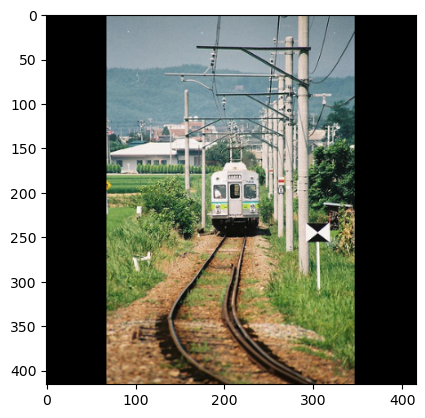

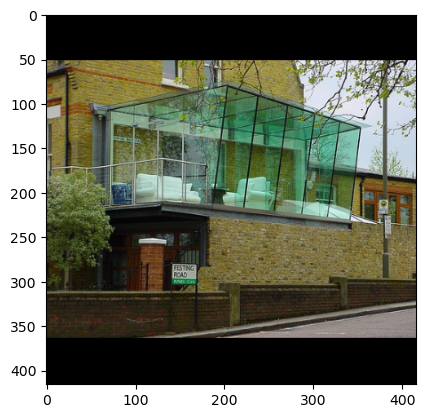

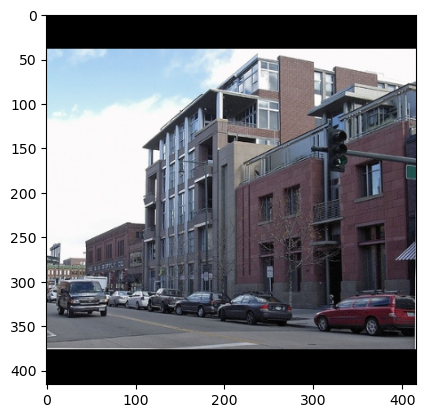

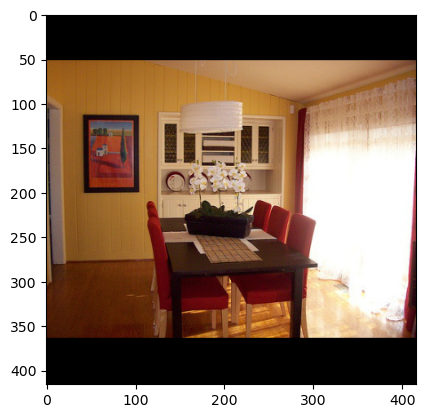

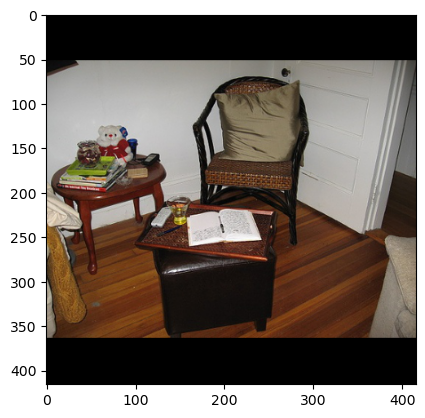

...

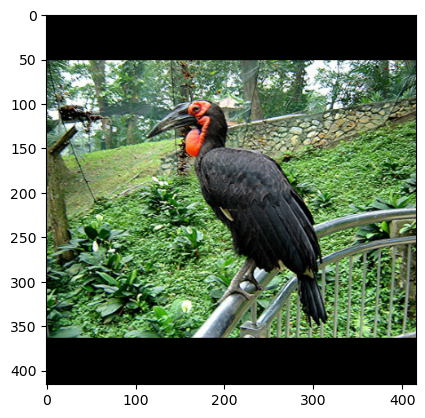

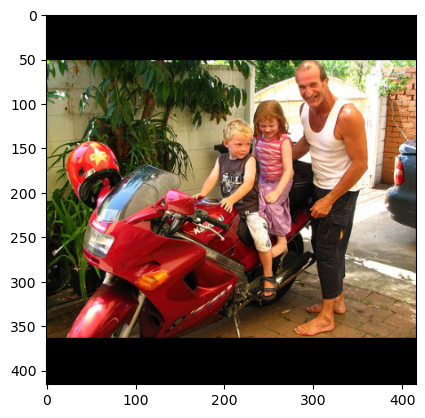

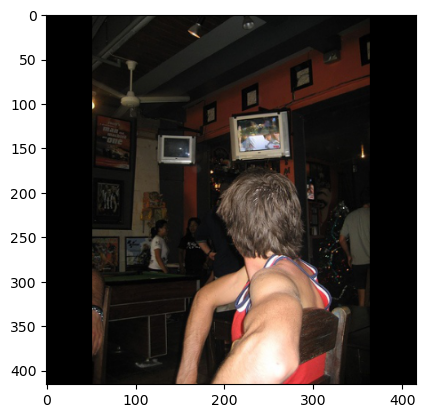

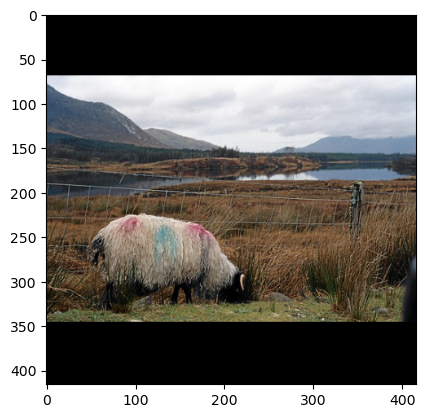

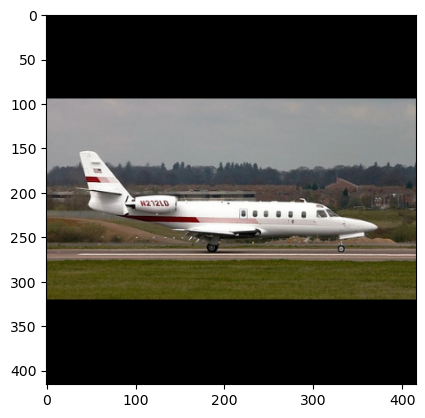

In [13]:
plot_couple_examples(model, test_loader, 0.5, 0.5, torch.tensor(config.ANCHORS).to('cuda'))